In [1]:
from fish_helpers import *
from MERFISH_Objects.FISHData import *
import anndata
import torch

In [2]:
base_path = '/bigstore/Images2021/gaby/dredFISH/DPNMF_PolyA_2021Nov19/'
dataset = 'DPNMF_PolyA_2021Nov19'
fishdata = FISHData(os.path.join(base_path,'fishdata'))
data = fishdata.load_data('h5ad',dataset=dataset)
data

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


AnnData object with n_obs × n_vars = 99982 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'stage_x', 'stage_y'
    obsm: 'stage'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors'

In [71]:
data.obs

,label,pixel_x,pixel_y,nuclei_size,nuclei_signal,cytoplasm_size,cytoplasm_signal,total_size,total_signal,posname,posname_stage_x,posname_stage_y,stage_x,stage_y
0,1.0,2.184211,1036.754395,114.0,2240.0,99.0,1568.0,213.0,1920.0,Pos1,-3741.0,-3410.0,-3741.712053,-3747.981933
1,3.0,4.411765,371.397919,289.0,2496.0,232.0,1824.0,521.0,2256.0,Pos1,-3741.0,-3410.0,-3742.438235,-3531.075721
2,5.0,6.477124,862.071899,153.0,3136.0,566.0,3072.0,719.0,3088.0,Pos1,-3741.0,-3410.0,-3743.111542,-3691.035439
3,6.0,7.603730,952.538452,429.0,2320.0,65.0,1552.0,494.0,2176.0,Pos1,-3741.0,-3410.0,-3743.478816,-3720.527535
4,7.0,10.409292,145.630524,452.0,3536.0,616.0,2272.0,1068.0,2784.0,Pos1,-3741.0,-3410.0,-3744.393429,-3457.475551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951,1052.0,2040.988525,1194.005737,348.0,1360.0,128.0,976.0,469.0,1248.0,Pos99,-1745.0,3525.0,-2410.362259,3135.754130
952,1053.0,2040.210083,1423.917603,376.0,2256.0,217.0,1568.0,593.0,2000.0,Pos99,-1745.0,3525.0,-2410.108487,3060.802862
953,1054.0,2042.615967,1494.047974,250.0,1504.0,70.0,832.0,318.0,1328.0,Pos99,-1745.0,3525.0,-2410.892805,3037.940361
954,1055.0,2043.655762,1652.926270,122.0,1008.0,74.0,992.0,192.0,992.0,Pos99,-1745.0,3525.0,-2411.231778,2986.146036


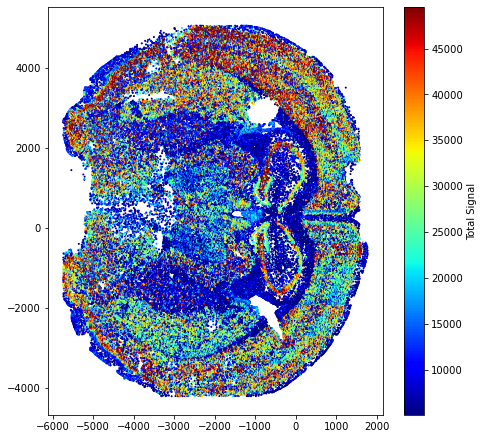

In [58]:
""" Compare Nuclei to cytoplasm """
x = data.obs['stage_x']
y = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)
plt.figure(figsize=[7.5,7.5])
plt.scatter(x,y,s=1,c=c,s=1vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.show()

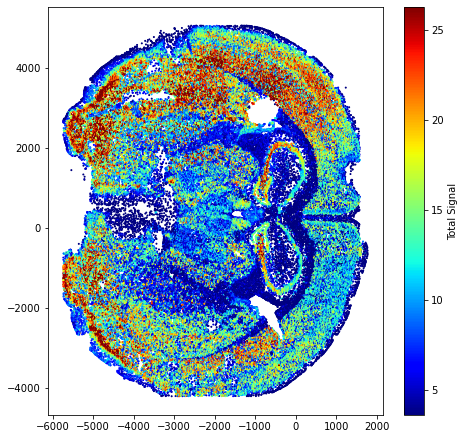

In [60]:
""" Compare Nuclei to cytoplasm """
x = data.obs['stage_x']
y = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)/data.obs['total_signal']
plt.figure(figsize=[7.5,7.5])
plt.scatter(x,y,s=1,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.show()

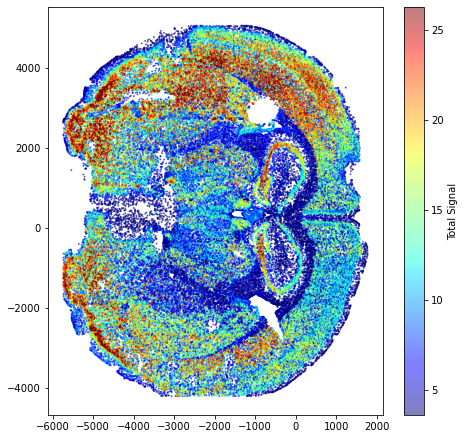

In [62]:
""" Compare Nuclei to cytoplasm """
x = data.obs['stage_x']
y = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)/data.obs['total_signal']
plt.figure(figsize=[7.5,7.5])
plt.scatter(x,y,s=1,alpha=0.5,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.show()

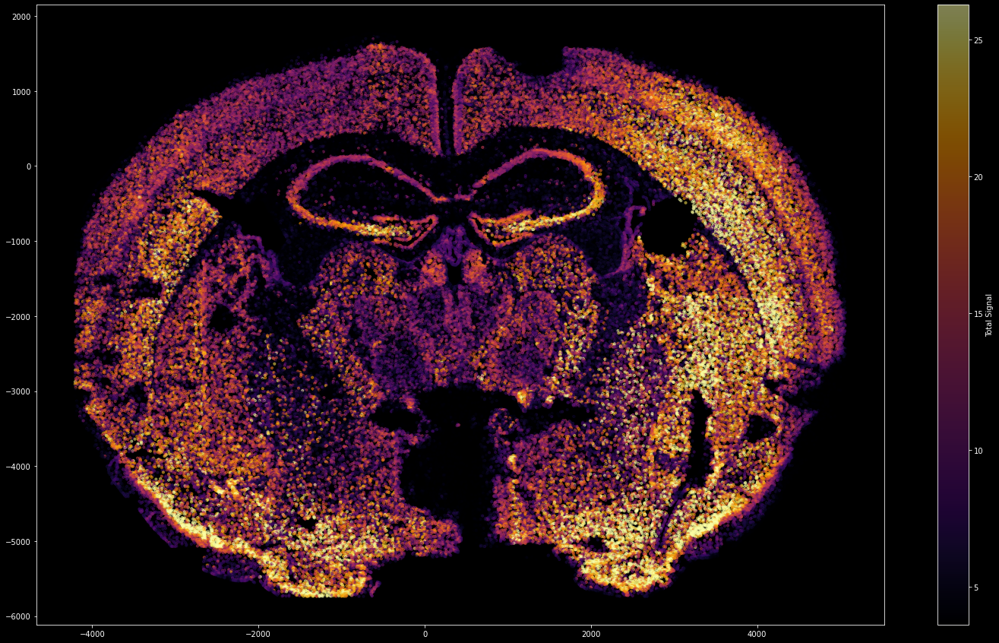

In [68]:
""" Compare Nuclei to cytoplasm """
plt.style.use('dark_background')
y = data.obs['stage_x']
x = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)/data.obs['total_signal']
plt.figure(figsize=[25,15])
plt.scatter(x,y,s=10,alpha=0.5,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='inferno')
plt.colorbar(label='Total Signal')
plt.show()

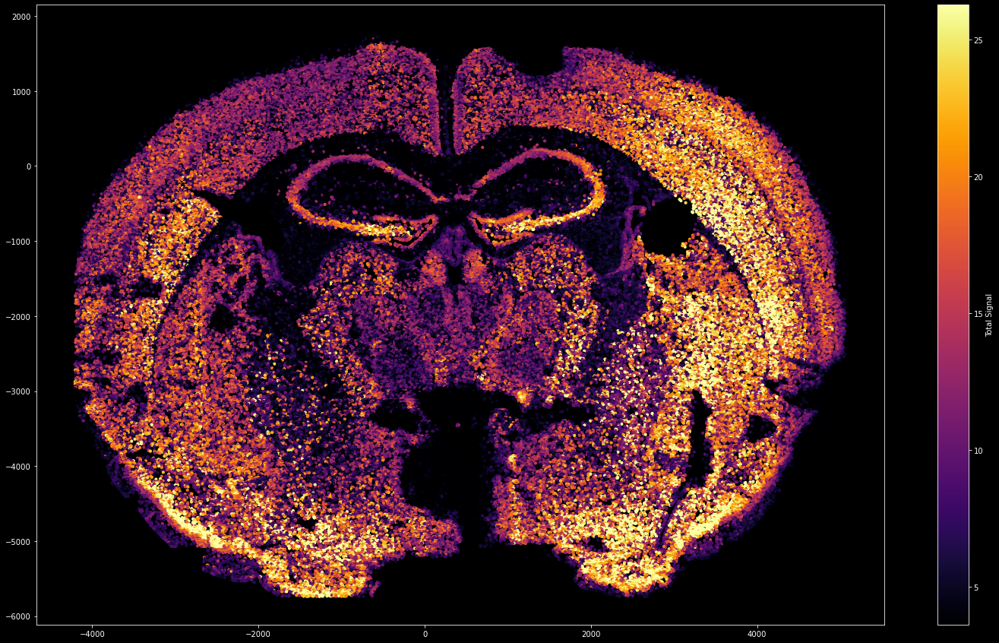

In [72]:
""" Compare Nuclei to cytoplasm """
plt.style.use('dark_background')
y = data.obs['stage_x']
x = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)/data.obs['total_signal']
plt.figure(figsize=[25,15])
plt.scatter(x,y,s=10,alpha=1,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='inferno')
plt.colorbar(label='Total Signal')
plt.show()

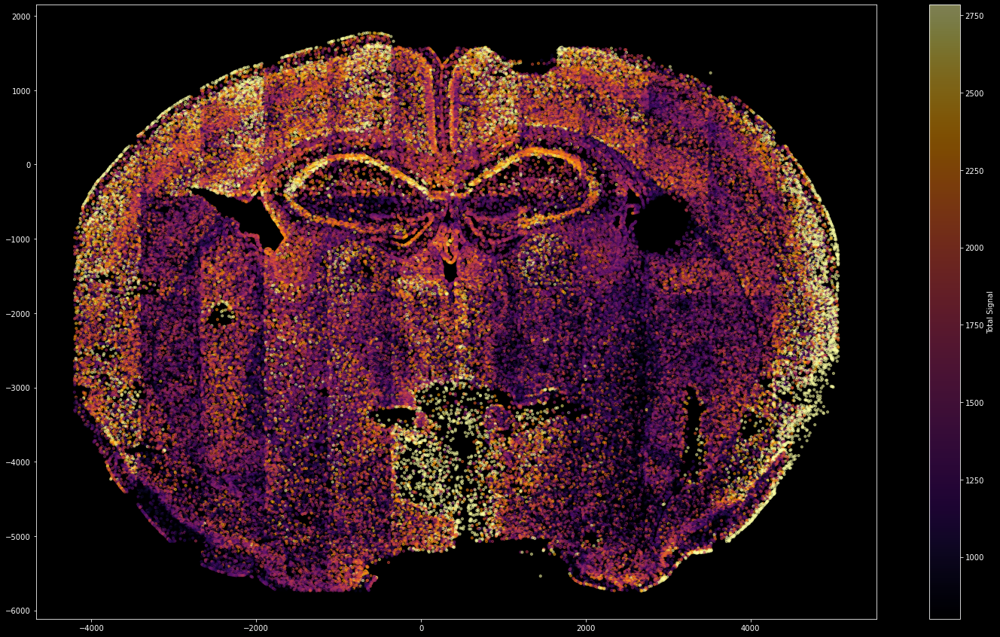

In [70]:
""" Compare Nuclei to cytoplasm """
plt.style.use('dark_background')
y = data.obs['stage_x']
x = data.obs['stage_y']
c = data.obs['total_signal']
plt.figure(figsize=[25,15])
plt.scatter(x,y,s=10,alpha=0.5,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='inferno')
plt.colorbar(label='Total Signal')
plt.show()

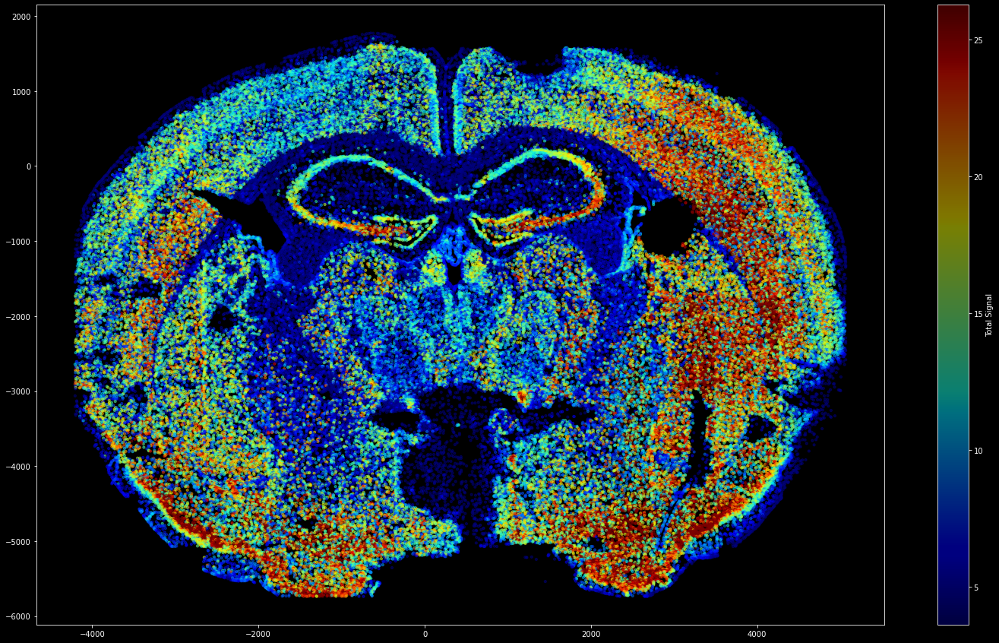

In [69]:
""" Compare Nuclei to cytoplasm """
plt.style.use('dark_background')
y = data.obs['stage_x']
x = data.obs['stage_y']
c = data.layers['total_vectors'].sum(1)/data.obs['total_signal']
plt.figure(figsize=[25,15])
plt.scatter(x,y,s=10,alpha=0.5,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.show()

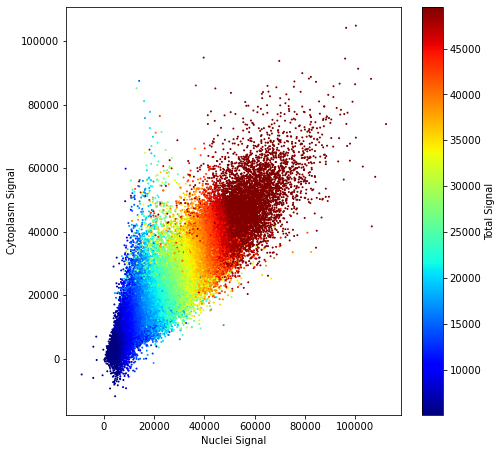

In [55]:
""" Compare Nuclei to cytoplasm """
x = data.layers['nuclei_vectors'].sum(1)
y = data.layers['cytoplasm_vectors'].sum(1)
c = data.layers['total_vectors'].sum(1)
plt.figure(figsize=[7.5,7.5])
plt.scatter(x,y,s=1,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.xlabel('Nuclei Signal')
plt.ylabel('Cytoplasm Signal')
plt.show()

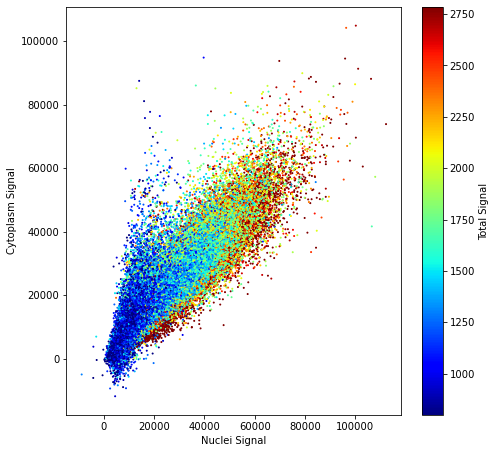

In [57]:
""" Compare Nuclei to cytoplasm """
x = data.layers['nuclei_vectors'].sum(1)
y = data.layers['cytoplasm_vectors'].sum(1)
c = data.obs['total_signal']
plt.figure(figsize=[7.5,7.5])
plt.scatter(x,y,s=1,c=c,vmin=np.percentile(c[np.isnan(c)==False],5),vmax=np.percentile(c[np.isnan(c)==False],95),cmap='jet')
plt.colorbar(label='Total Signal')
plt.xlabel('Nuclei Signal')
plt.ylabel('Cytoplasm Signal')
plt.show()

In [3]:
data

AnnData object with n_obs × n_vars = 99982 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'stage_x', 'stage_y'
    obsm: 'stage'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors'

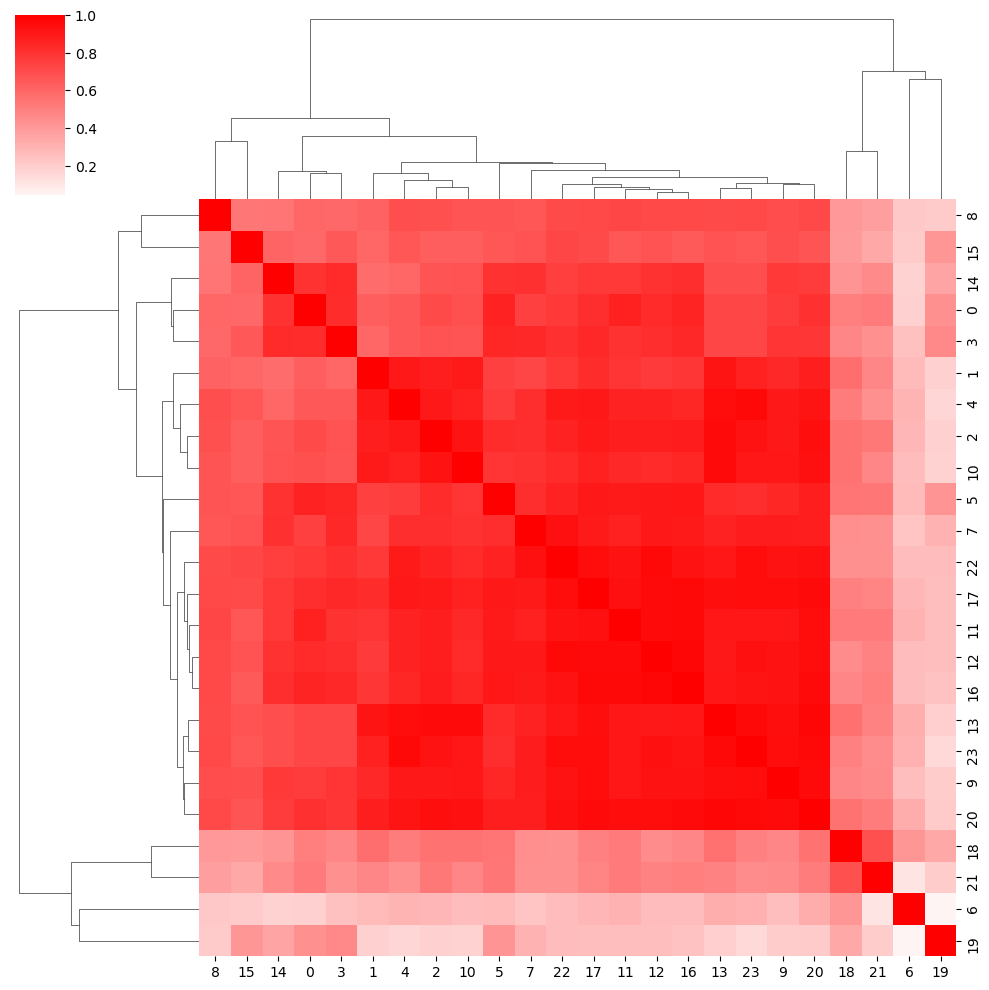

In [4]:
plt.style.use('default')
from scipy.stats import pearsonr,spearmanr
""" Check Correlation """
X = np.array(data.layers['total_vectors']).copy()
# X = X/np.array(data.obs['total_signal'])[:,None]
# X = X/X.sum(1)[:,None]
corr_mat = np.zeros([24,24])
for i in range(24):
    I = X[:,i]
    for j in range(24):
        J = X[:,j]
        m = (np.isnan(J)+np.isnan(I))==False
        corr_mat[i,j] = pearsonr(I[m],J[m])[0]
import seaborn as sns
sns.clustermap(corr_mat,cmap='bwr',center=0)

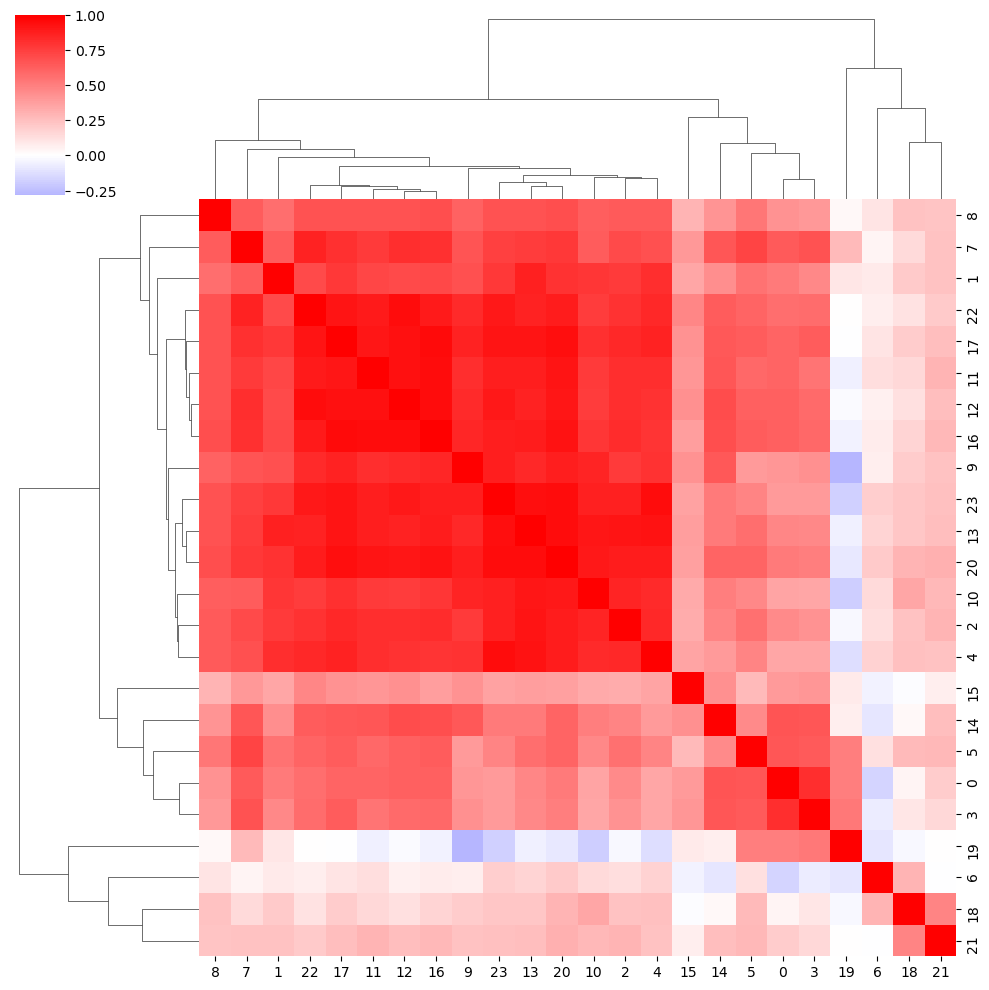

In [5]:
plt.style.use('default')
from scipy.stats import pearsonr,spearmanr
""" Check Correlation """
X = np.array(data.layers['total_vectors']).copy()
X = X/np.array(data.obs['total_signal'])[:,None]
# X = X/X.sum(1)[:,None]
corr_mat = np.zeros([24,24])
for i in range(24):
    I = X[:,i]
    for j in range(24):
        J = X[:,j]
        m = (np.isnan(J)+np.isnan(I))==False
        corr_mat[i,j] = pearsonr(I[m],J[m])[0]
import seaborn as sns
sns.clustermap(corr_mat,cmap='bwr',center=0)

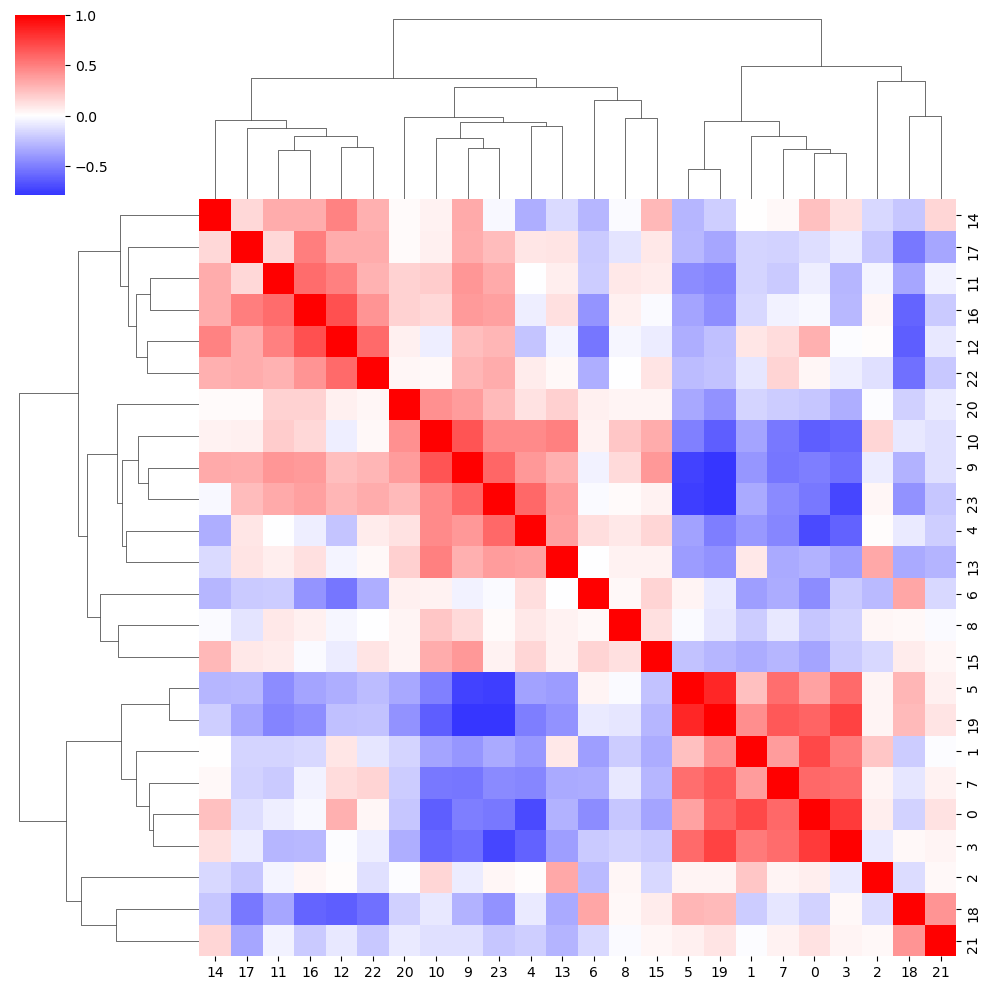

In [6]:
plt.style.use('default')
from scipy.stats import pearsonr,spearmanr
""" Check Correlation """
X = np.array(data.layers['total_vectors']).copy()
# X = X/np.array(data.obs['total_signal'])[:,None]
X = X/X.sum(1)[:,None]
corr_mat = np.zeros([24,24])
for i in range(24):
    I = X[:,i]
    for j in range(24):
        J = X[:,j]
        m = (np.isnan(J)+np.isnan(I))==False
        corr_mat[i,j] = pearsonr(I[m],J[m])[0]
import seaborn as sns
sns.clustermap(corr_mat,cmap='bwr',center=0)

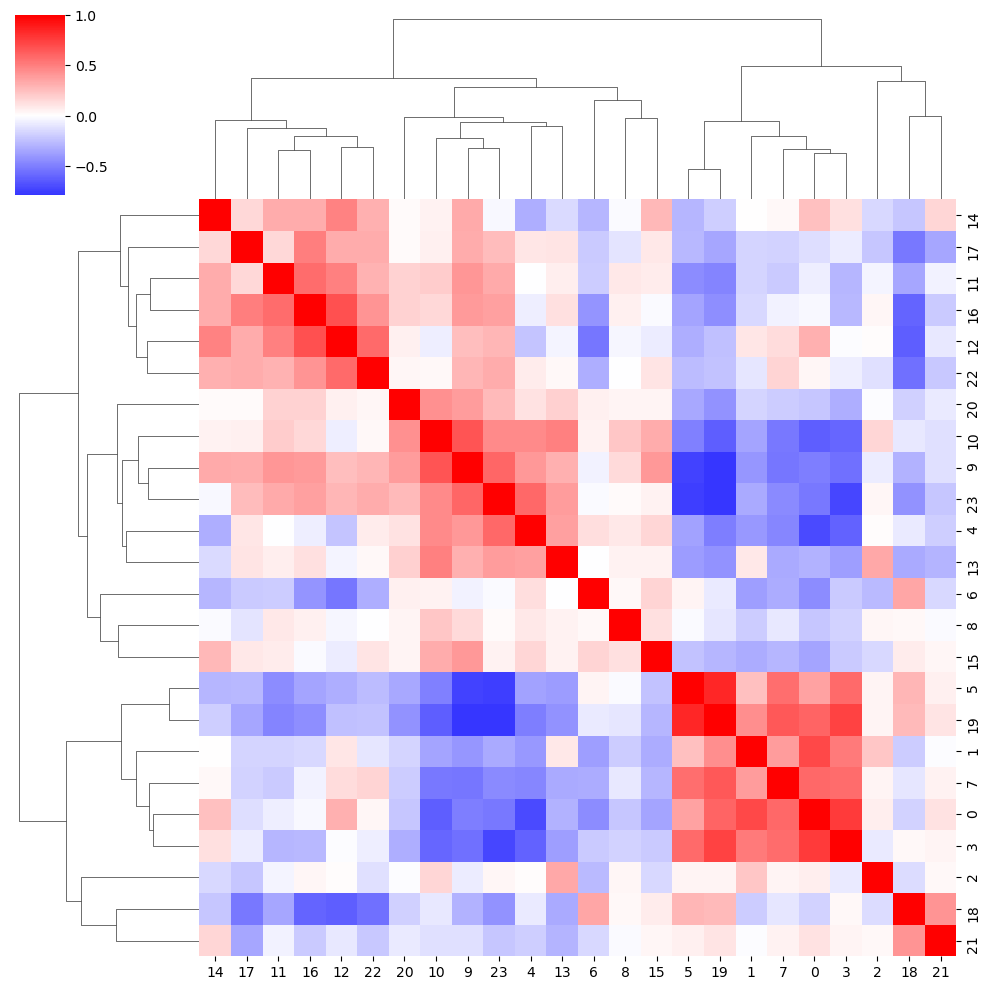

In [7]:
plt.style.use('default')
from scipy.stats import pearsonr,spearmanr
""" Check Correlation """
X = np.array(data.layers['total_vectors']).copy()
X = X/np.array(data.obs['total_signal'])[:,None]
X = X/X.sum(1)[:,None]
corr_mat = np.zeros([24,24])
for i in range(24):
    I = X[:,i]
    for j in range(24):
        J = X[:,j]
        m = (np.isnan(J)+np.isnan(I))==False
        corr_mat[i,j] = pearsonr(I[m],J[m])[0]
import seaborn as sns
sns.clustermap(corr_mat,cmap='bwr',center=0)

/tmp/ipykernel_34047/3940521567.py:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  data.X = data.X/data.obs['total_signal'][:,None]
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


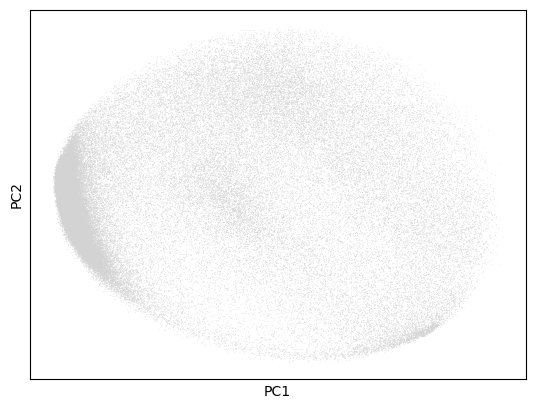

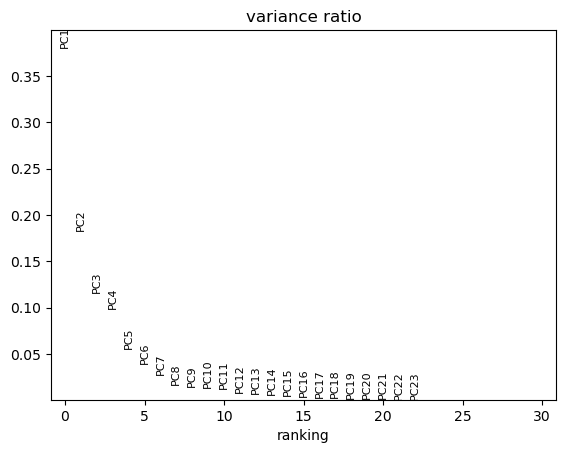

In [8]:
import scanpy as sc
from sklearn.preprocessing import normalize
data.X = np.array(data.layers['total_vectors']).copy()
data = data[np.isnan(data.X.max(1))==False]
data.X = data.X/data.obs['total_signal'][:,None]
data.X = data.X - np.array([np.percentile(data.X[:,i],25) for i in range(data.X.shape[1])])
data.X = data.X / np.array([np.percentile(data.X[:,i],75) for i in range(data.X.shape[1])])
data.X = normalize(data.X)
sc.tl.pca(data, svd_solver='arpack')
sc.pl.pca(data)
sc.pl.pca_variance_ratio(data, log=False)

In [41]:
import time
start = time.time()
sc.pp.neighbors(data, n_neighbors=15, n_pcs=0)
sc.tl.leiden(data,resolution=5)
time.time()-start

156.99268794059753

In [42]:
xy = np.zeros([data.shape[0],2])
xy[:,1] = data.obs['stage_x']
xy[:,0] = data.obs['stage_y']
data.obsm['stage'] = xy

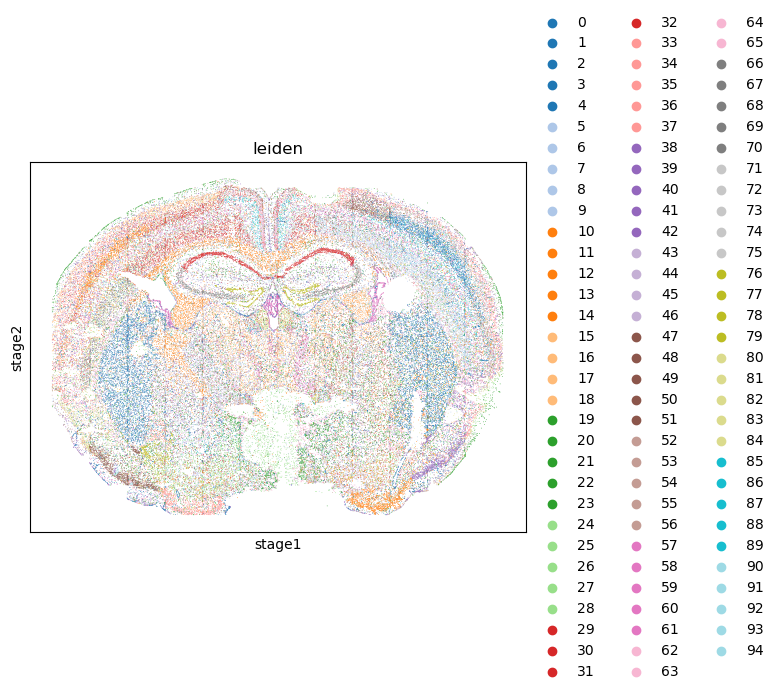

In [43]:
sc.pl.embedding(data,'stage', color=['leiden'],palette ='tab20')

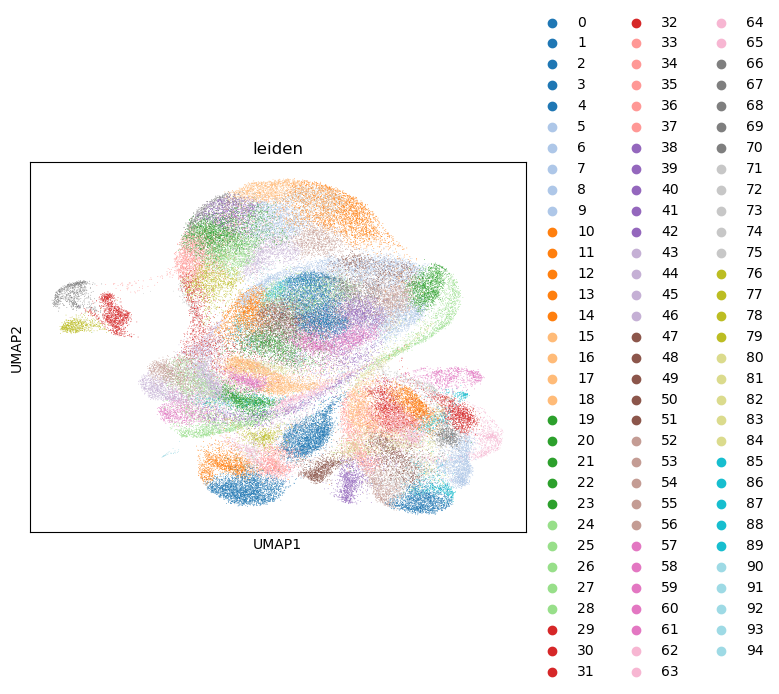

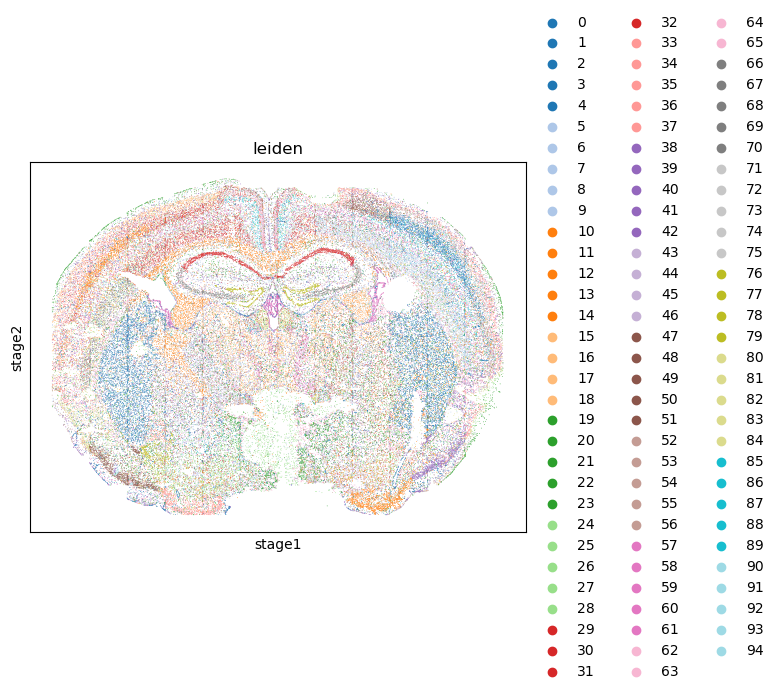

In [46]:
sc.tl.paga(data)
sc.pl.paga(data, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(data, init_pos='paga')
sc.pl.umap(data, color=['leiden'])
sc.pl.embedding(data,'stage', color=['leiden'])

In [48]:
""" SLOW"""
sc.tl.tsne(data,n_jobs=40)

/home/zach/miniconda3/envs/pyfish_3.9/lib/python3.9/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(


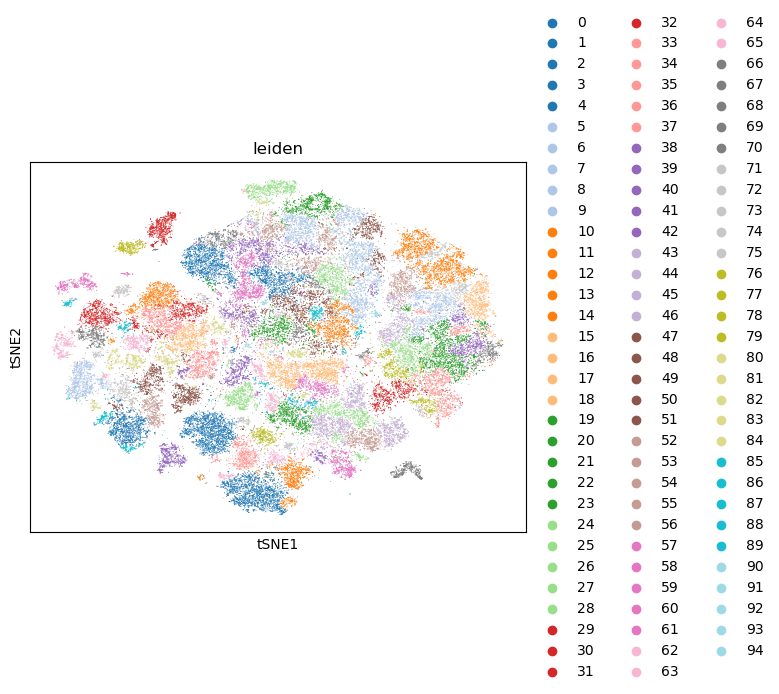

In [51]:
sc.pl.tsne(data,color=['leiden'])

In [49]:
data

AnnData object with n_obs × n_vars = 97786 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'stage_x', 'stage_y', 'leiden'
    uns: 'pca', 'neighbors', 'leiden', 'leiden_colors', 'paga', 'leiden_sizes', 'umap', 'dendrogram_leiden', 'tsne'
    obsm: 'stage', 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors'
    obsp: 'distances', 'connectivities'

In [57]:
data.varm['PCs'].shape

(24, 23)

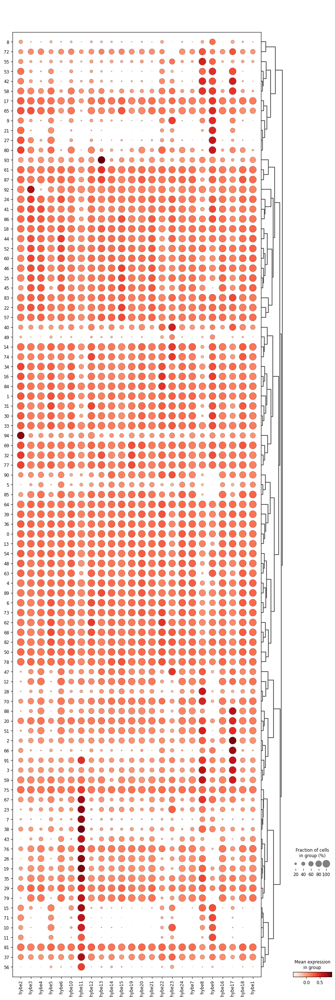

In [45]:
sc.tl.dendrogram(data,groupby='leiden',n_pcs=0)
genes  = np.array(data.var.index)
sc.pl.dotplot(data, genes, groupby='leiden', dendrogram=True)

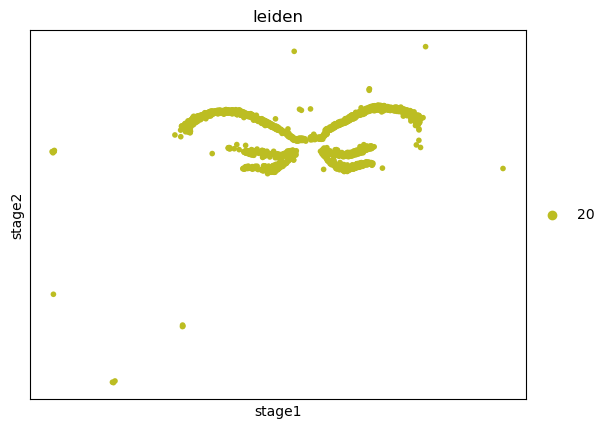

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


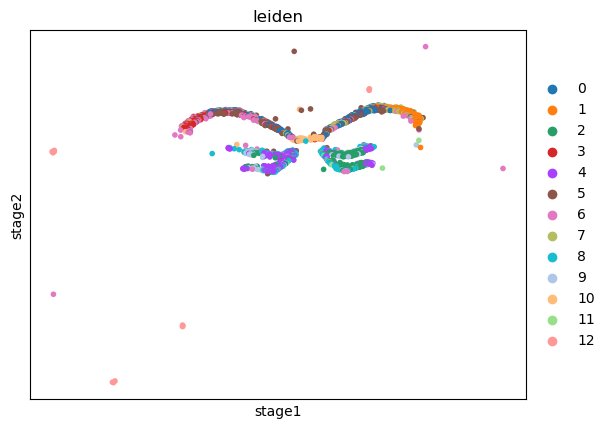

In [23]:
""" Subcluster zones """
data_zone = data[data.obs['leiden']=='20']
sc.pl.embedding(data_zone,'stage', color=['leiden'])
sc.pp.neighbors(data_zone, n_neighbors=15, n_pcs=0)
sc.tl.leiden(data_zone)
sc.pl.embedding(data_zone,'stage', color=['leiden'])